In [102]:
import torch 
from distutils.command.build_scripts import first_line_re
import urllib
import Bio.PDB
import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt
import pandas as pd


In [137]:
aa_list = ['ALA', 'ARG', 'ASN', 'ASP', 'AYA','CYS','GLN', 'GLN', 'GLY', 'HIS', 'ILE','LEU', 'LYS', 'MET', 'PHE', 'PRO','SER', 'THR', 'TRP', 'TYR', 'VAL']


torch.cuda.is_available()

True

In [9]:
structure = Bio.PDB.PDBParser(PERMISSIVE = True, QUIET = True).get_structure(pdb_code, pdb_filename)
model = structure[0]


In [72]:
# make a function that returns the distance between reside 1 and 2
def calc_residue_dist_test(residue_A, residue_B):
    diff_vector  = residue_A["CA"].coord - residue_B["CA"].coord
    distance = np.sqrt(np.sum(diff_vector * diff_vector))
    return distance

# calculate the distance matrix
def calc_dist_matrix_test(chain_one, chain_two) :
     answer = np.zeros((len(chain_one), len(chain_two)), np.float64)
     for row, residue_A in enumerate(chain_one):
         try:
            for col, residue_B in enumerate(chain_two):
                try:
                    answer[row, col] = calc_residue_dist(residue_A, residue_B)
                except KeyError:
                    break
         except KeyError:
             break
#      print(answer)
     return answer

In [144]:
# list of pdbs to download 

pdb_list = pd.read_csv("../BioPython/database/structure_list.txt", sep=",", header=None)
pdb_list


,0,1
0,chrmine,7SFK
1,c1c2,3UG9
2,ChR2,6EID
3,Chrmson,5ZIH
4,BR,1FBB
5,BtRhodopsin,1F88
6,GtACR1,7L1E
7,Rhodopsin-1,6I9K
8,TpRhodopsin,2ZIY
9,AR2,3AM6


In [145]:
def download_pdb(pdb_from_list):

    urllib.request.urlretrieve('https://files.rcsb.org/view/'+pdb_from_list+'.pdb', pdb_from_list+'.pdb')
    pdb_filename = pdb_from_list+'.pdb'
    return


In [146]:
pdb_codes = pdb_list[1].array
for item in pdb_codes:
    print(item)
    try:
        download_pdb(item)
    except:
        print("error unable to download: "+item)
        continue
    

7SFK
3UG9
6EID
5ZIH
1FBB
1F88
7L1E
6I9K
2ZIY
3AM6
5AX0
5B2N
1JGJ
7AKX
6SQG
6RF6
6KFQ
7W74
6LM0
6AB9
7AKW
6GYH
6XL3
4HYJ
6UCU
6UKN
6XDC
7M19
7RTT
7SK0
7RTW
3J5P
6J8J
6BPZ
3J9P
7N5D
3RIF
6VXX
7JTL
1GFL
1E12
3A7K
1SS8
1K6F
4XT3
7LGU
6CQ6
4WFH
6X4S
7MH2


In [147]:
def get_res(pdb_code):
    pdb_filename = pdb_code+".pdb"
    structure = Bio.PDB.PDBParser(PERMISSIVE = True, QUIET = True).get_structure(pdb_code, pdb_filename)
    model = structure[0]
    model = structure.get_models()
    models = list(model)
    chains = list(models[0].get_chains()) 
    residues = list(chains[0].get_residues()) 
    all_res = [] # this shows all the residues excluding non-amino acids
    
    for res in residues:
        resname = res.get_resname()
        if resname in aa_list:
            all_res.append(res)
    
    return all_res

In [155]:
def dist_matrix(x,y):
    
    dm_build = calc_dist_matrix_test(y, y)
    cm_build = dm_build < 10 

    
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 6))
    ax[0].matshow(np.transpose(dm_build))
    ax[1].imshow(np.transpose(cm_build))

    ax[0].set_ylabel('amino acid index', loc='center')
    ax[1].set_xlabel('amino acid index', loc='center')

    plt.suptitle(x, 
                 fontweight='bold')

    plt.tight_layout()
    plt.show()
    
    torch_ex_float_tensor = torch.from_numpy(dm_build)
    
    print ("Minimum distance", torch.min(torch_ex_float_tensor))
    print ("Maximum distance", torch.max(torch_ex_float_tensor))
    print ("Standard deviation and mean: distogram", torch.std_mean(torch_ex_float_tensor))
    


    return dm_build, cm_build 


In [149]:
# store residue list of  each pdb in a dictionary

pdb_res = {}

for pdb in pdb_codes:
    
    pdb_res[pdb] = get_res(pdb) 
    

# print(pdb_res.get('7SFK'))


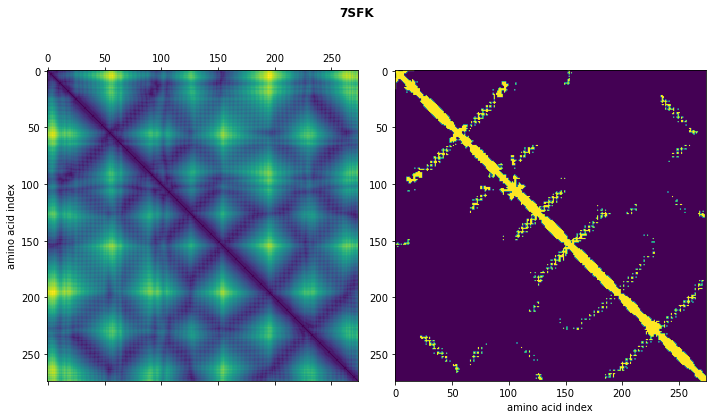

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(74.1718, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(12.3004, dtype=torch.float64), tensor(26.7600, dtype=torch.float64))


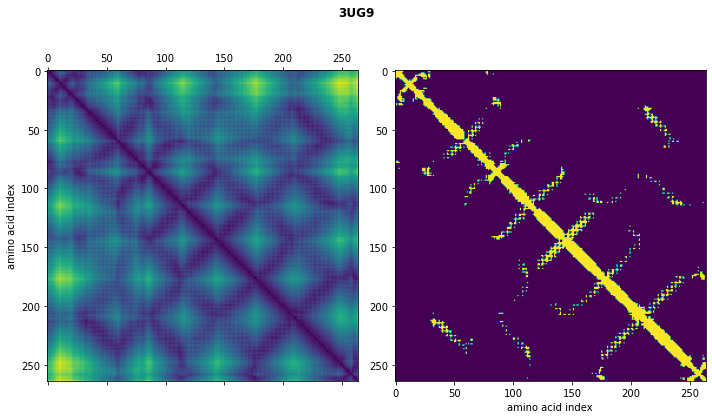

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(85.7687, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(13.7716, dtype=torch.float64), tensor(27.5427, dtype=torch.float64))


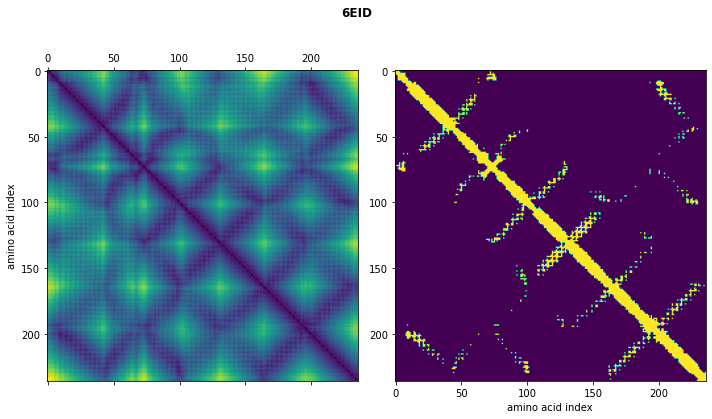

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(68.8440, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(11.1392, dtype=torch.float64), tensor(24.9096, dtype=torch.float64))


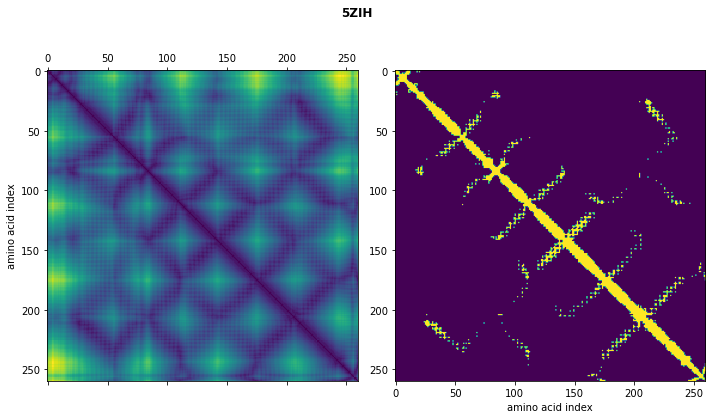

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(85.4396, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(14.0001, dtype=torch.float64), tensor(28.0039, dtype=torch.float64))


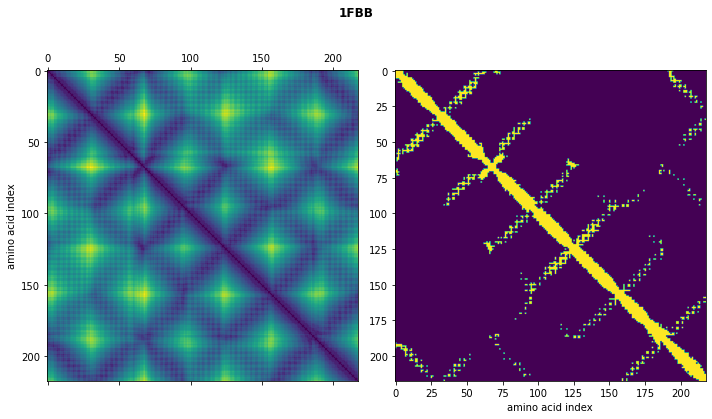

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(57.8225, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(9.8333, dtype=torch.float64), tensor(22.9168, dtype=torch.float64))


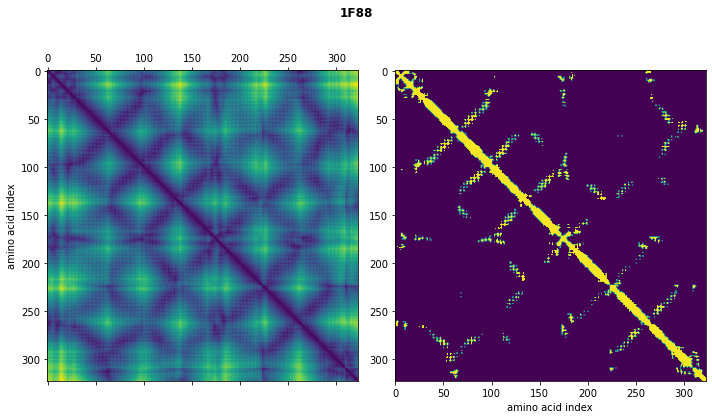

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(76.1742, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(12.7245, dtype=torch.float64), tensor(27.7043, dtype=torch.float64))


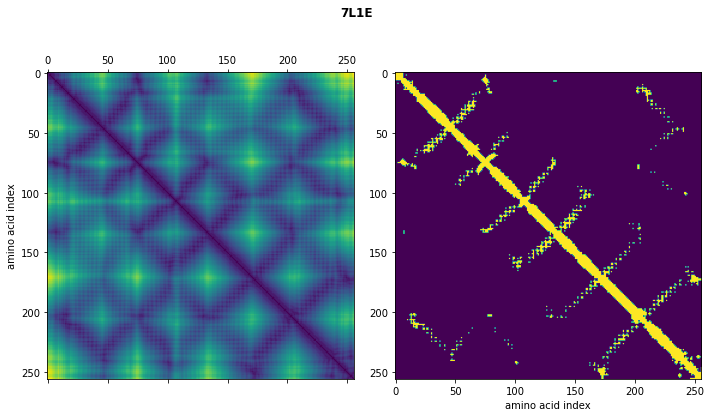

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(76.1267, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(12.4191, dtype=torch.float64), tensor(26.6007, dtype=torch.float64))


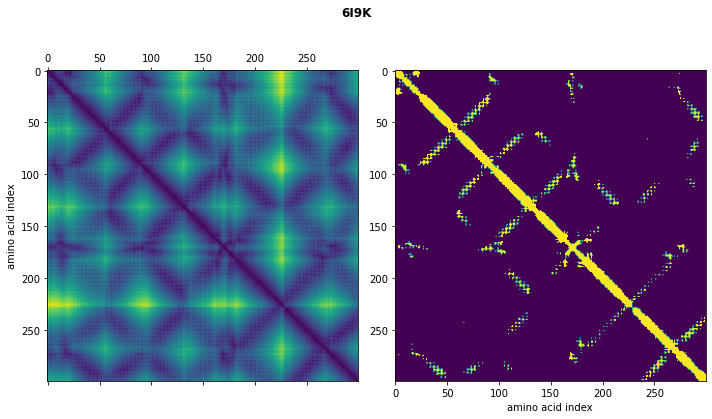

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(81.4293, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(13.0845, dtype=torch.float64), tensor(27.4175, dtype=torch.float64))


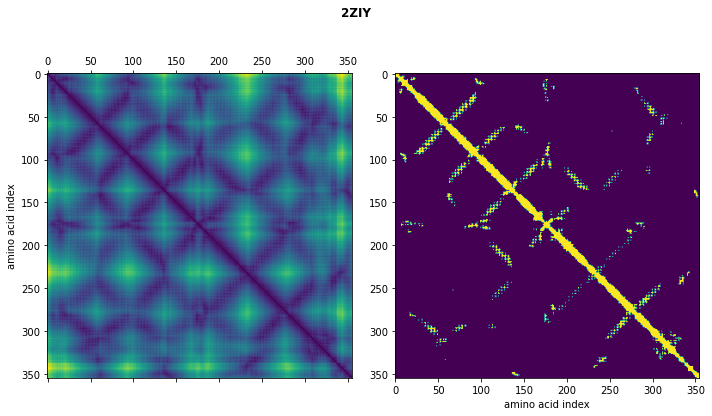

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(94.4839, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(14.6873, dtype=torch.float64), tensor(30.2006, dtype=torch.float64))


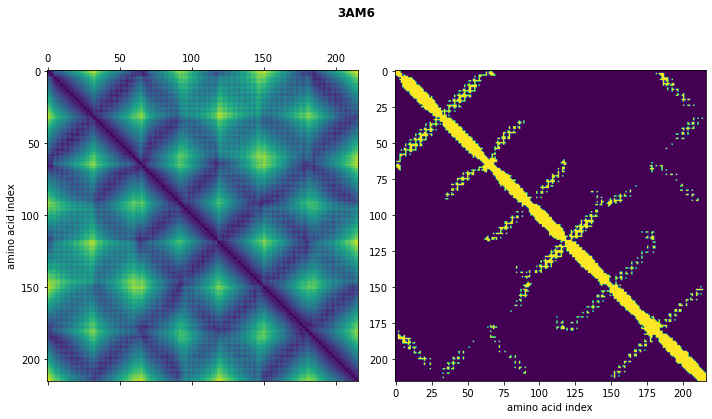

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(60.1406, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(9.9791, dtype=torch.float64), tensor(22.9978, dtype=torch.float64))


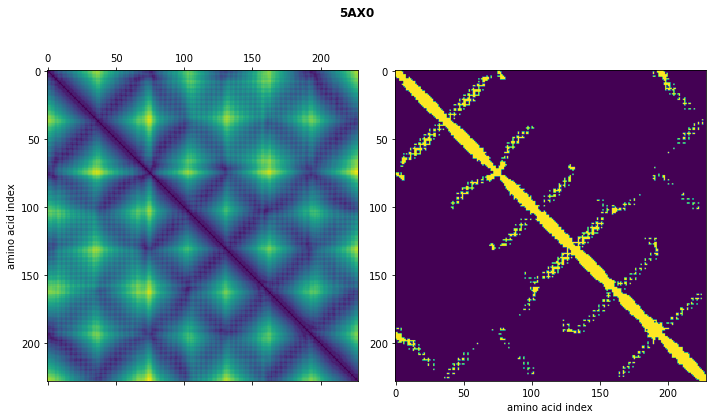

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(62.0102, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(10.4184, dtype=torch.float64), tensor(23.6653, dtype=torch.float64))


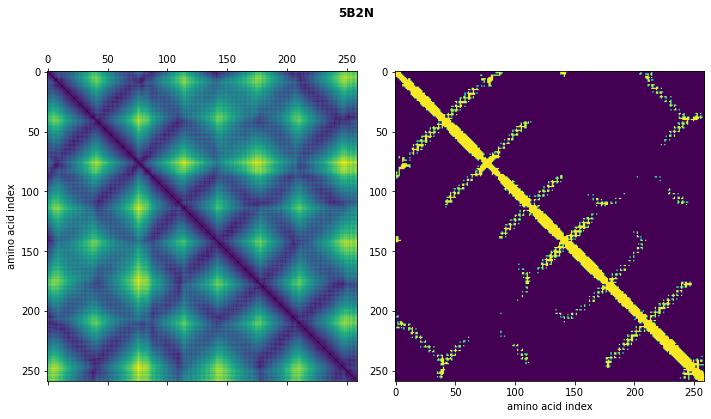

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(65.6743, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(11.6376, dtype=torch.float64), tensor(25.3695, dtype=torch.float64))


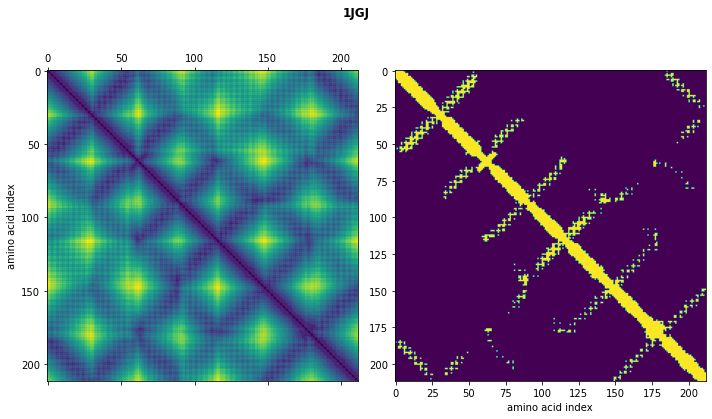

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(51.7607, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(9.4661, dtype=torch.float64), tensor(22.4138, dtype=torch.float64))


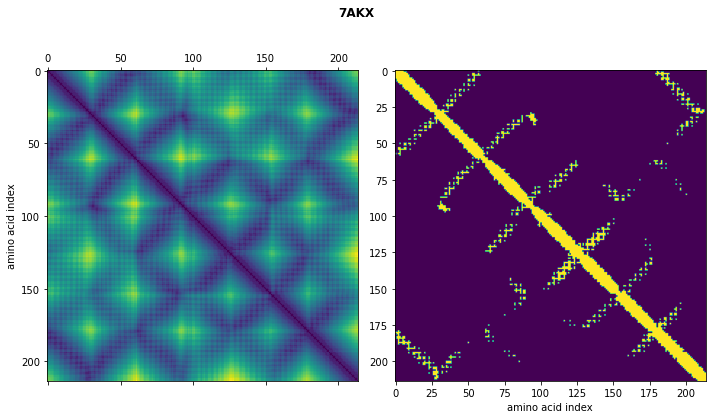

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(58.7035, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(10.0052, dtype=torch.float64), tensor(23.4152, dtype=torch.float64))


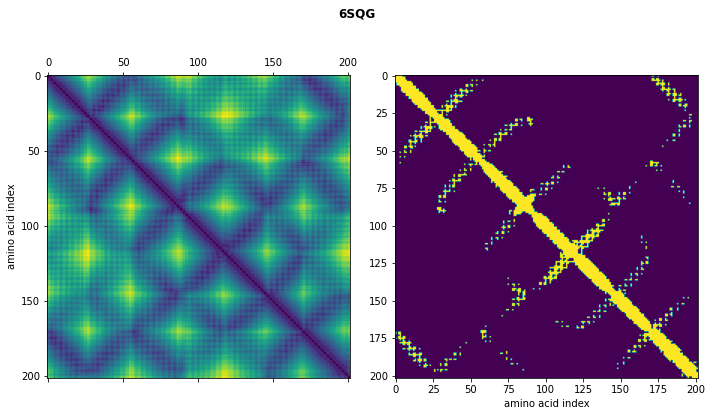

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(50.6510, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(9.1305, dtype=torch.float64), tensor(21.9720, dtype=torch.float64))


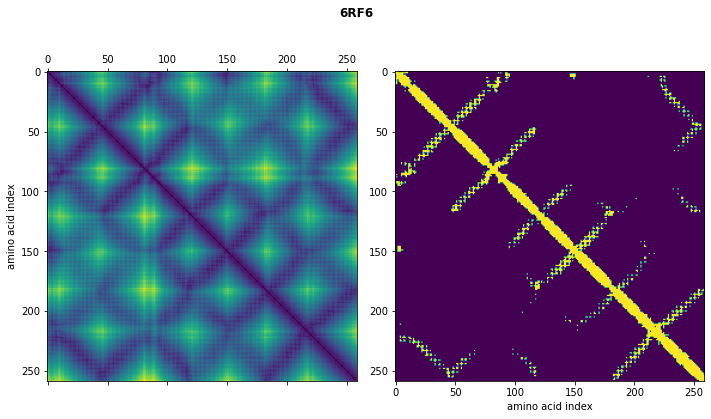

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(68.6866, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(11.4693, dtype=torch.float64), tensor(25.2537, dtype=torch.float64))


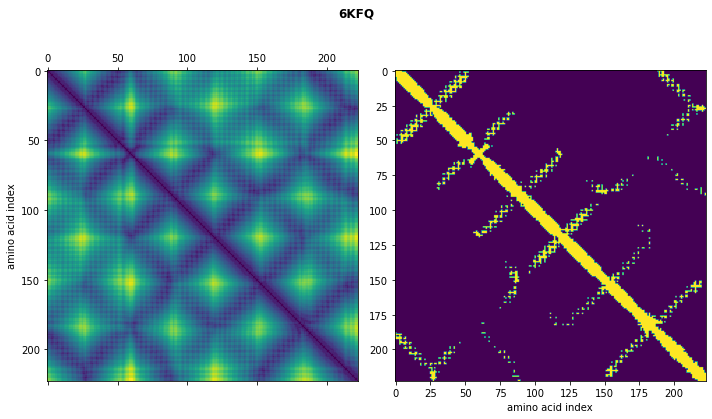

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(56.0127, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(9.9424, dtype=torch.float64), tensor(22.9988, dtype=torch.float64))


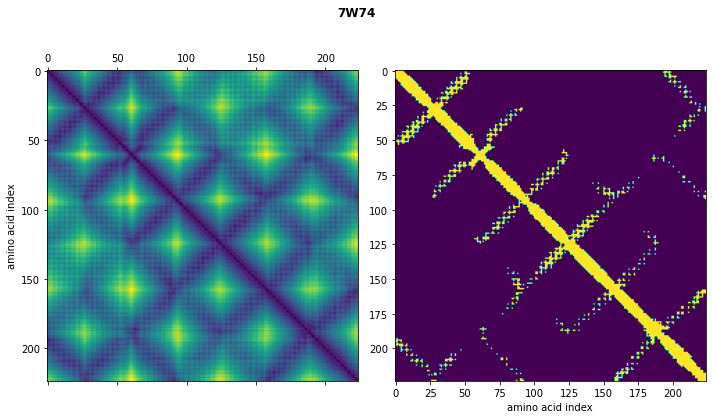

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(56.0988, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(10.0237, dtype=torch.float64), tensor(23.1273, dtype=torch.float64))


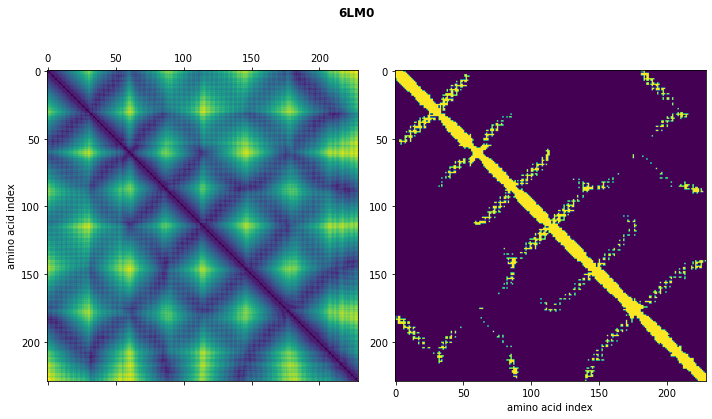

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(56.8245, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(10.2921, dtype=torch.float64), tensor(23.5539, dtype=torch.float64))


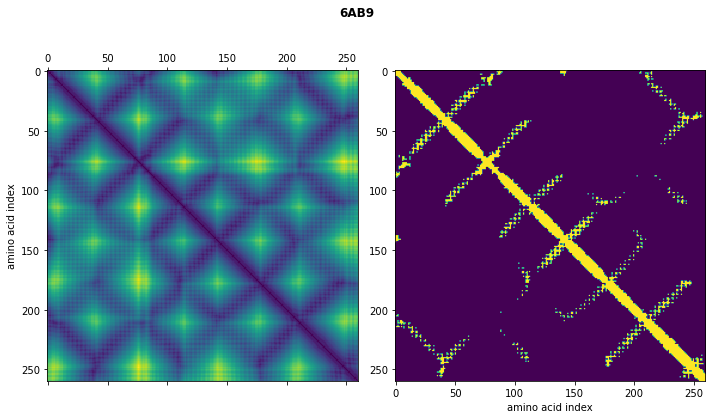

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(66.1088, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(11.7133, dtype=torch.float64), tensor(25.5281, dtype=torch.float64))


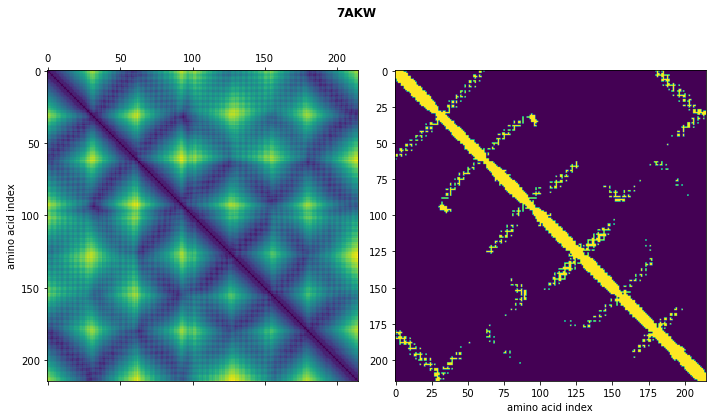

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(56.8999, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(9.9484, dtype=torch.float64), tensor(23.3070, dtype=torch.float64))


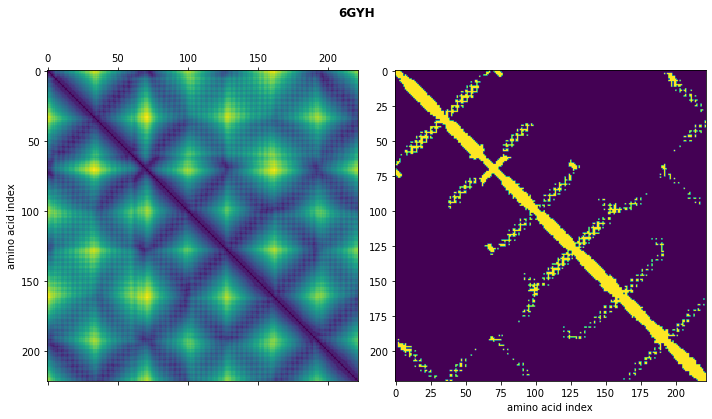

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(56.6822, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(10.0002, dtype=torch.float64), tensor(23.0202, dtype=torch.float64))


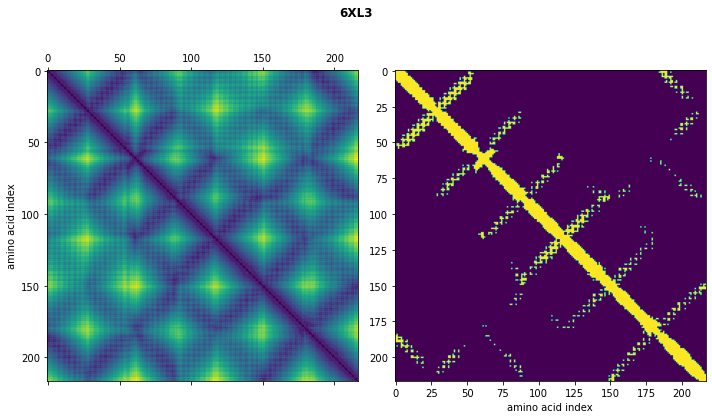

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(56.8532, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(9.7371, dtype=torch.float64), tensor(22.8112, dtype=torch.float64))


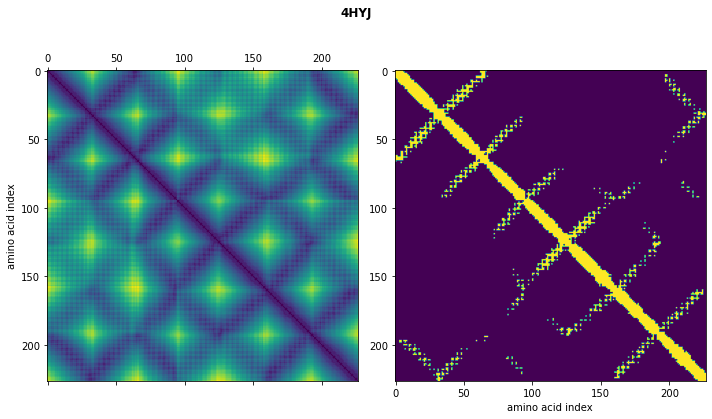

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(57.9456, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(10.4216, dtype=torch.float64), tensor(23.7060, dtype=torch.float64))


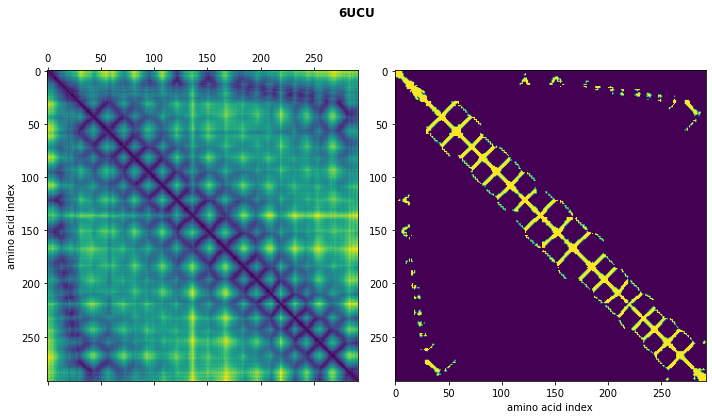

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(64.0989, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(11.2750, dtype=torch.float64), tensor(28.6468, dtype=torch.float64))


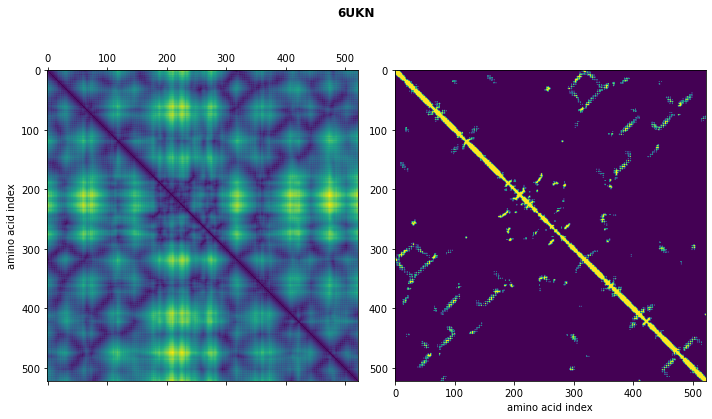

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(91.1952, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(14.8747, dtype=torch.float64), tensor(32.5441, dtype=torch.float64))


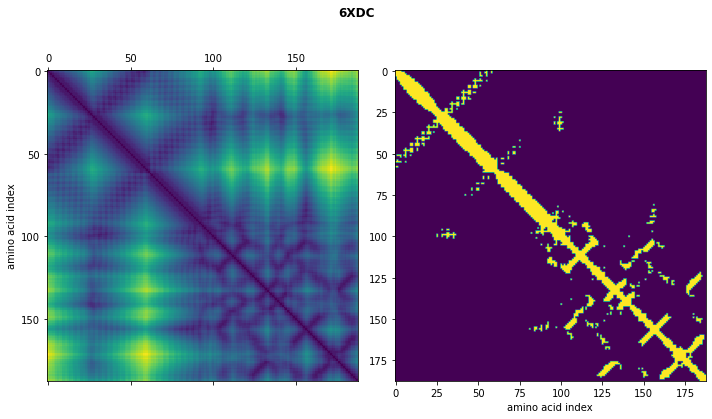

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(79.0192, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(15.2193, dtype=torch.float64), tensor(28.6144, dtype=torch.float64))


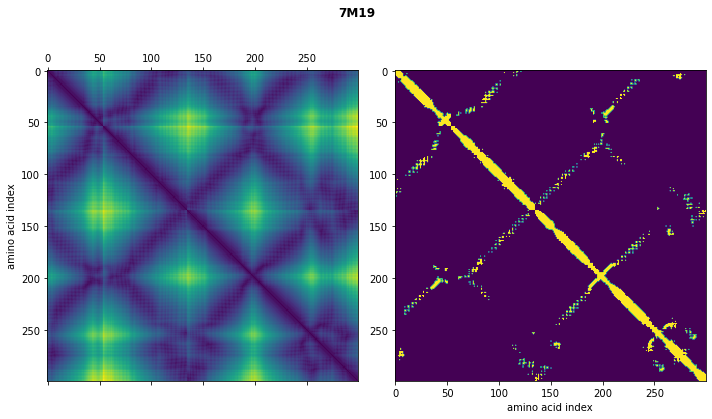

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(117.4546, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(22.8093, dtype=torch.float64), tensor(38.4114, dtype=torch.float64))


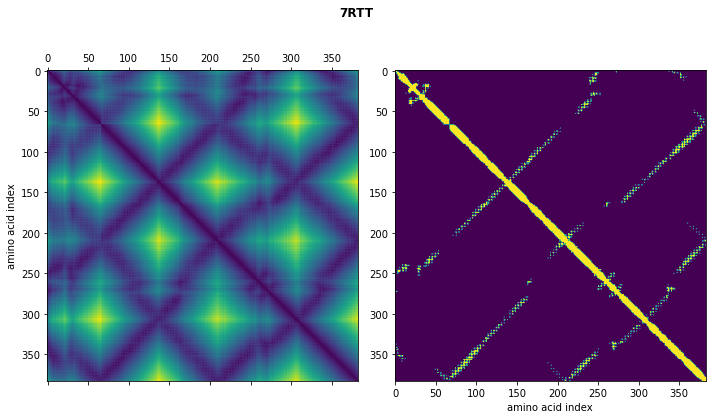

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(121.1410, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(23.7684, dtype=torch.float64), tensor(40.9491, dtype=torch.float64))


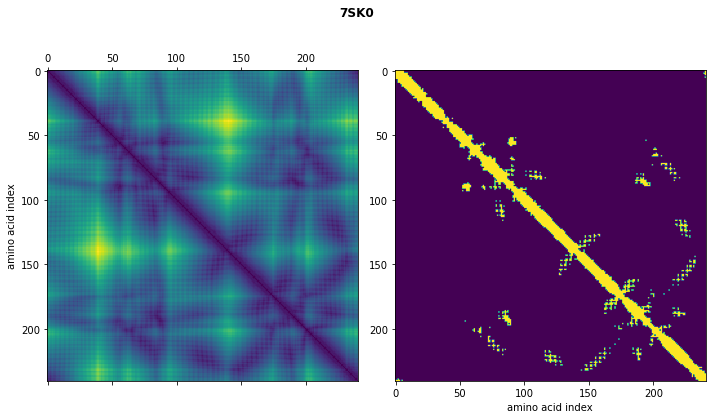

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(81.0954, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(13.1073, dtype=torch.float64), tensor(29.0299, dtype=torch.float64))


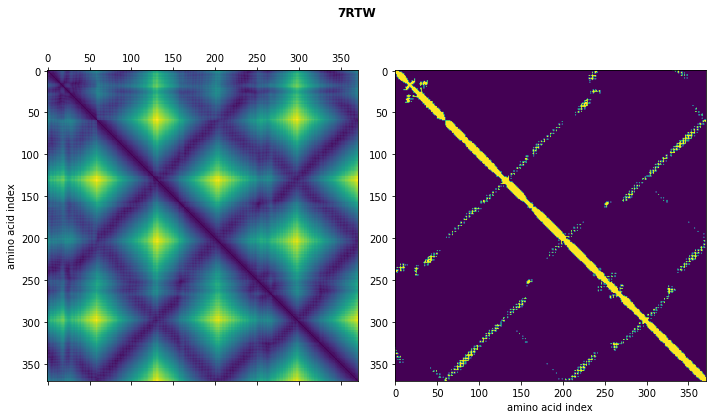

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(116.0830, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(23.4457, dtype=torch.float64), tensor(40.4967, dtype=torch.float64))


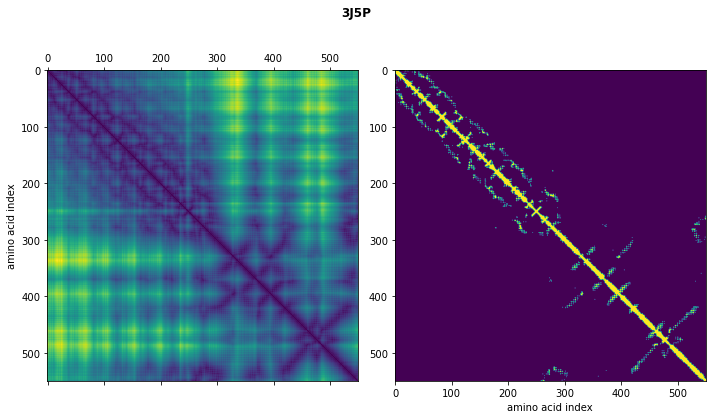

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(116.1891, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(22.9284, dtype=torch.float64), tensor(44.7732, dtype=torch.float64))


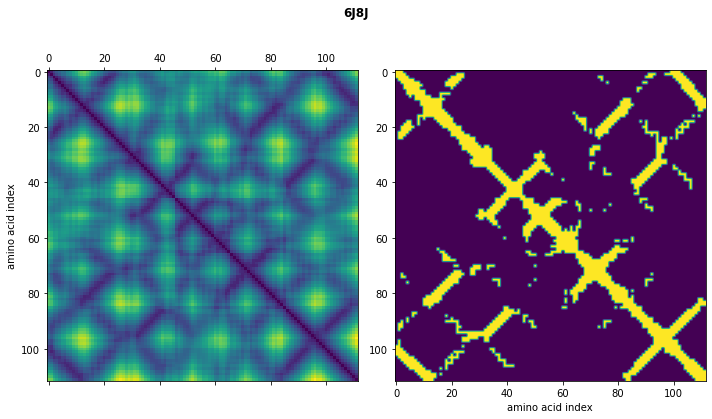

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(44.2228, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(7.7507, dtype=torch.float64), tensor(17.9209, dtype=torch.float64))


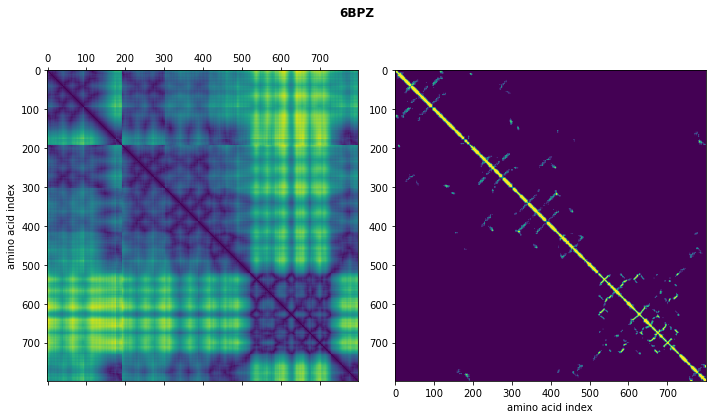

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(147.0395, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(31.5519, dtype=torch.float64), tensor(60.8553, dtype=torch.float64))


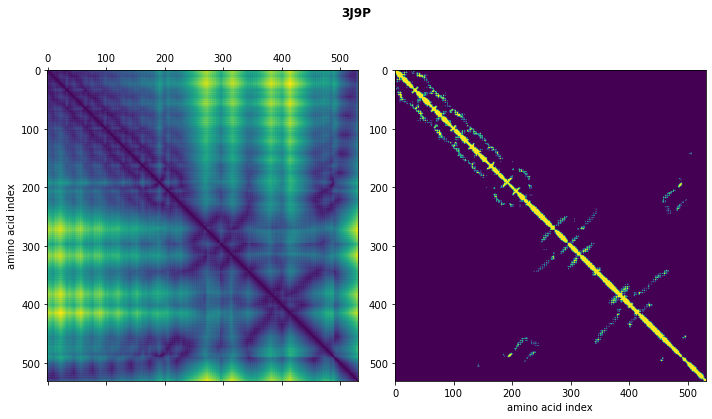

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(131.5327, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(26.3733, dtype=torch.float64), tensor(48.8672, dtype=torch.float64))


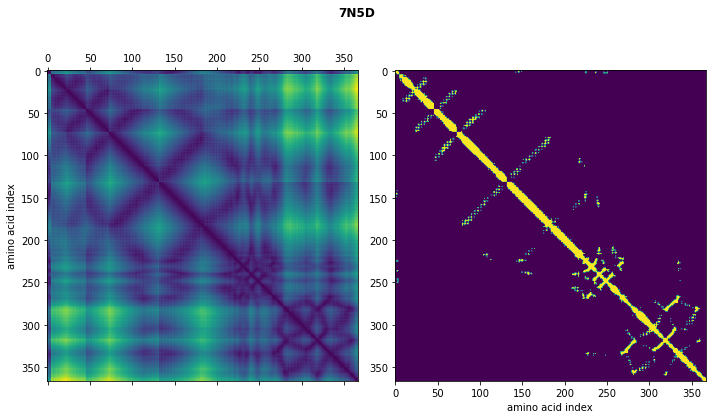

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(135.9061, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(23.7264, dtype=torch.float64), tensor(42.8991, dtype=torch.float64))


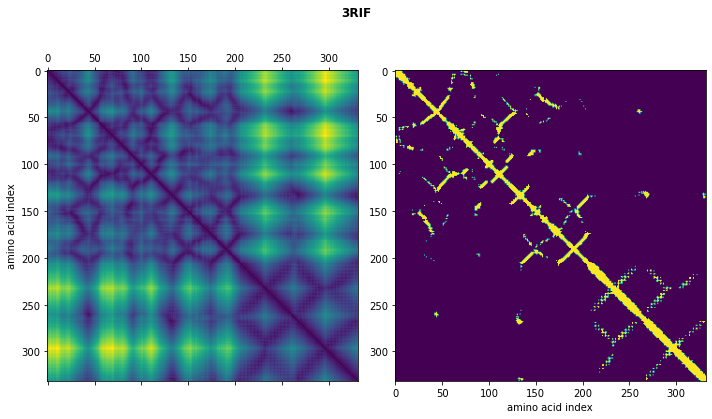

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(112.6355, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(23.0722, dtype=torch.float64), tensor(39.2298, dtype=torch.float64))


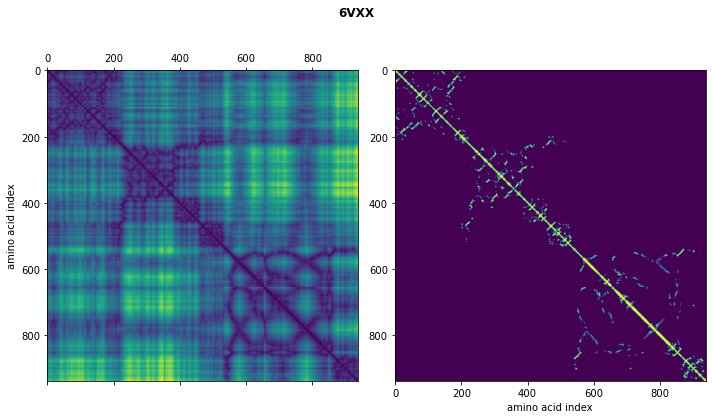

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(157.2986, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(26.7965, dtype=torch.float64), tensor(55.3285, dtype=torch.float64))


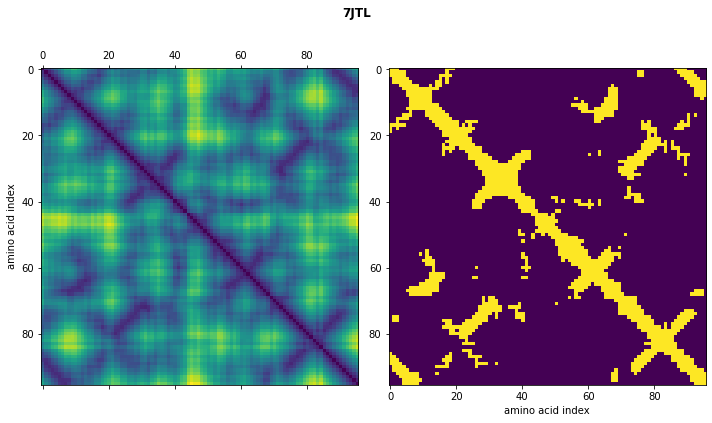

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(39.5562, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(7.1920, dtype=torch.float64), tensor(17.4500, dtype=torch.float64))


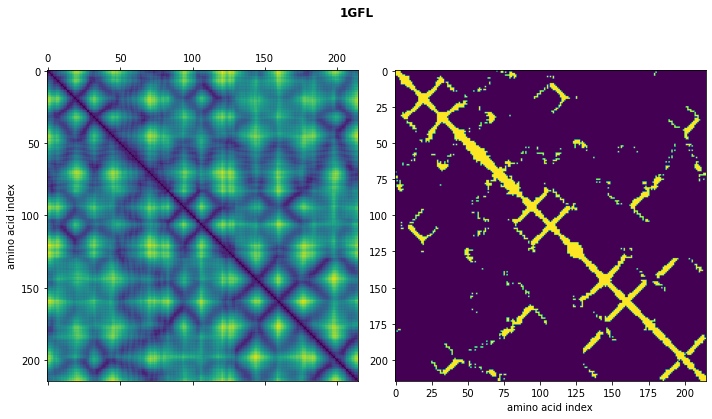

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(52.1965, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(9.0026, dtype=torch.float64), tensor(22.0759, dtype=torch.float64))


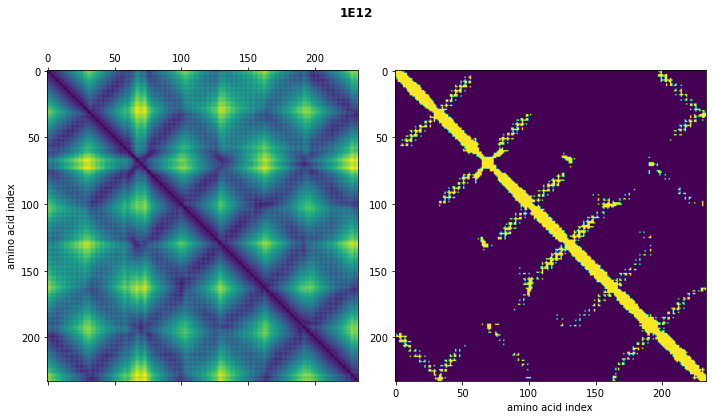

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(59.2541, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(10.4433, dtype=torch.float64), tensor(23.6011, dtype=torch.float64))


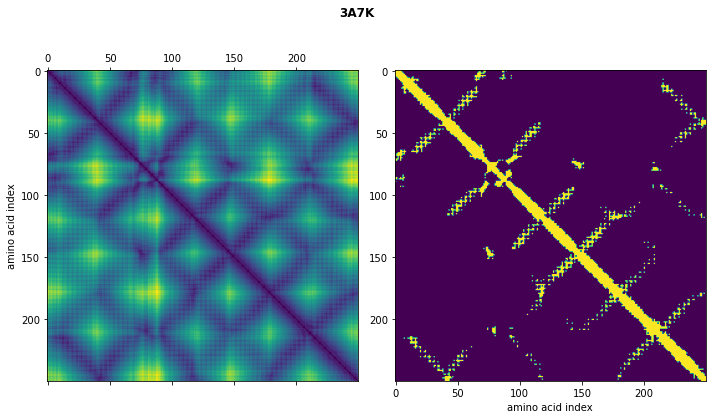

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(61.3763, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(10.9574, dtype=torch.float64), tensor(24.4078, dtype=torch.float64))


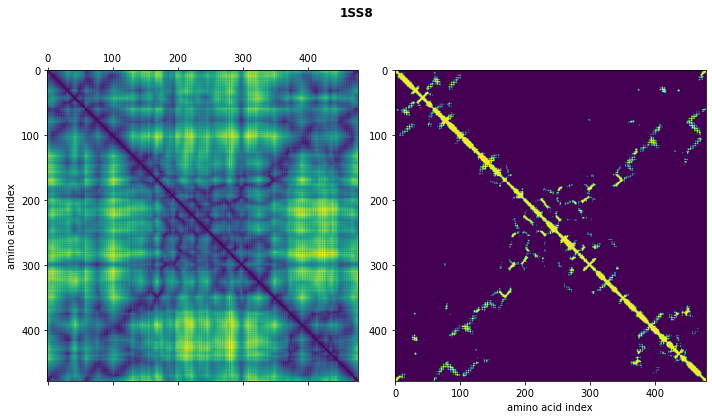

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(73.2823, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(13.8151, dtype=torch.float64), tensor(32.8061, dtype=torch.float64))


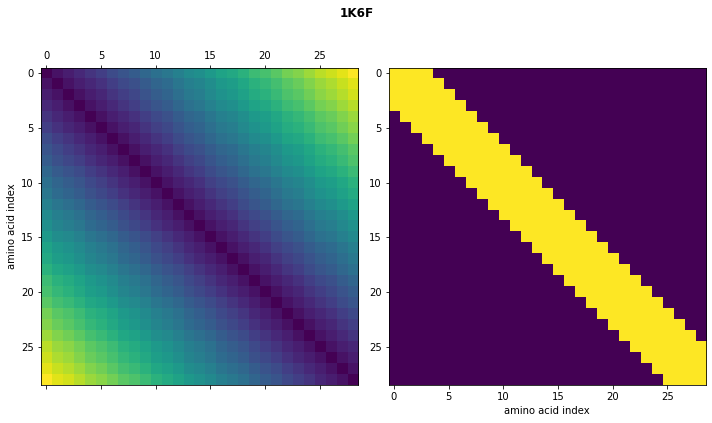

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(80.3566, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(19.3318, dtype=torch.float64), tensor(28.0415, dtype=torch.float64))


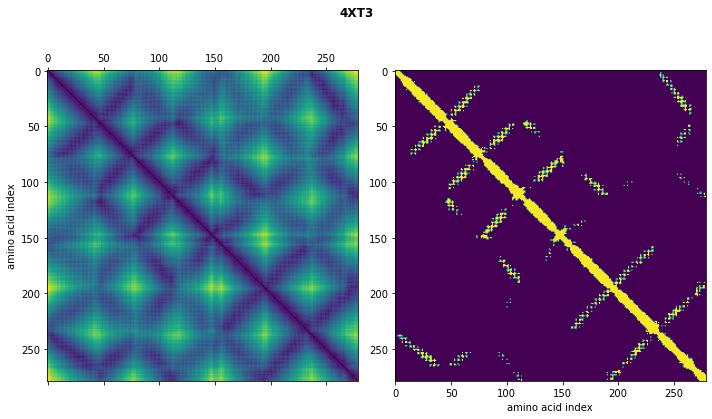

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(72.7919, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(12.0288, dtype=torch.float64), tensor(26.7453, dtype=torch.float64))


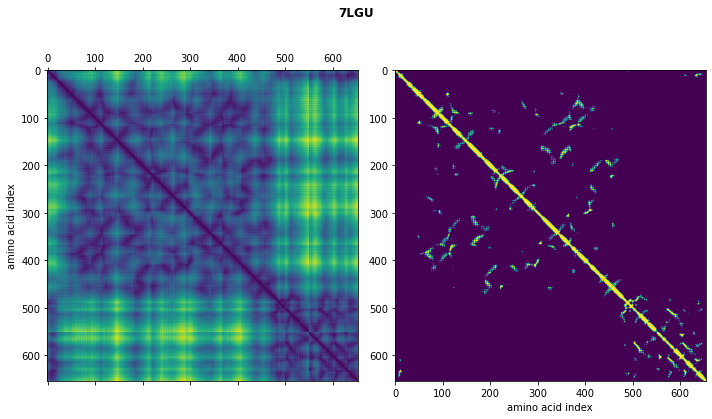

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(117.9099, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(22.4781, dtype=torch.float64), tensor(43.1084, dtype=torch.float64))


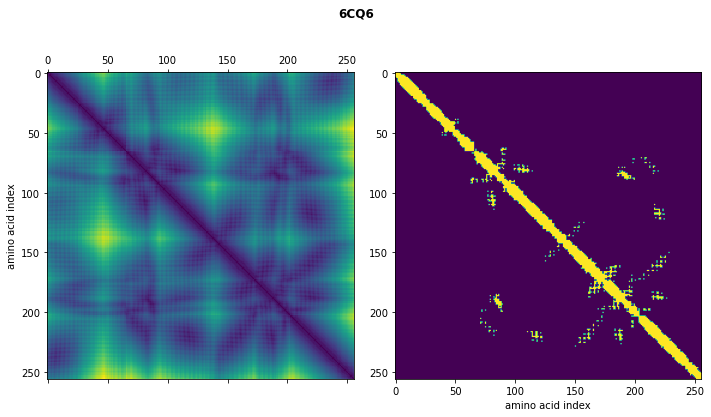

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(89.4431, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(15.5224, dtype=torch.float64), tensor(32.3370, dtype=torch.float64))


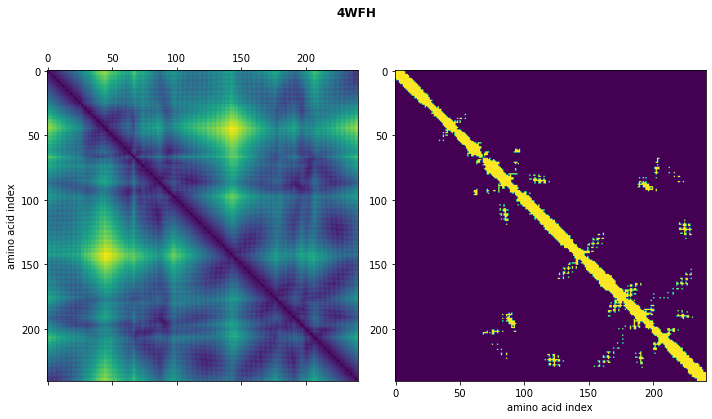

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(84.0906, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(14.1147, dtype=torch.float64), tensor(30.1066, dtype=torch.float64))


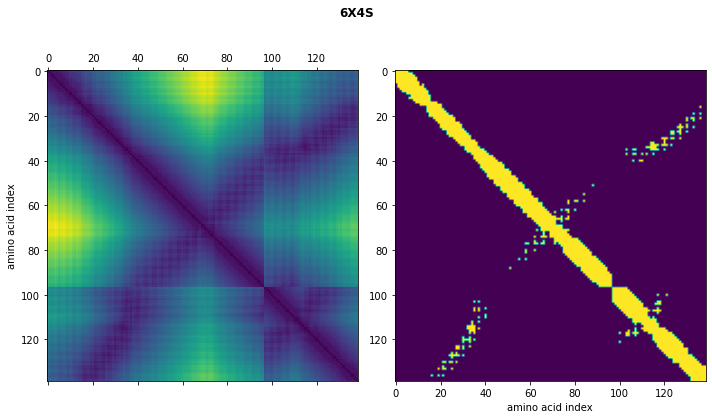

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(106.3528, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(22.9876, dtype=torch.float64), tensor(37.0844, dtype=torch.float64))


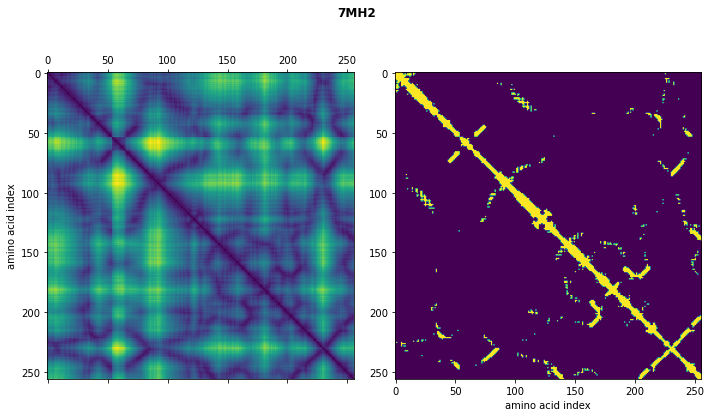

Minimum distance tensor(0., dtype=torch.float64)
Maximum distance tensor(82.2867, dtype=torch.float64)
Standard deviation and mean: distogram (tensor(14.9643, dtype=torch.float64), tensor(30.5429, dtype=torch.float64))


In [156]:
# store distograms and contact maps in dictionary

pdb_dist_matrices = {}

for x,y in pdb_res.items():
    
    pdb_dist_matrices[x] = dist_matrix(x,y)
    



In [77]:
# now lets analyze the tensors using PCA and/other tensor analysis methods, and plot the stats tracked thus far